In [1]:
#!pip install import-ipynb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import math
import import_ipynb
import cleaning
from sklearn import linear_model

importing Jupyter notebook from cleaning.ipynb


In [2]:
fifa_data = pd.read_csv('fifa21_train.csv')
#fifa_data.head()

In [3]:
# pd.set_option('display.max_rows', None)
# print(fifa_data.dtypes)
# pd.set_option('display.max_rows', 10)

fifa_data = cleaning.clean_df(fifa_data)
fifa_data.head()

,id,name,age,nationality,club,bp,position,team_contract,height,weight,...,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,ova
0,184383,A. Pasche,26,Switzerland,FC Lausanne-Sport,CM,CM CDM,FC Lausanne-Sport 2015 ~ 2020,175.26,161,...,59,59,59,58,54,54,54,58,15,64
1,188044,Alan Carvalho,30,China PR,Beijing Sinobo Guoan FC,ST,ST LW LM,"Beijing Sinobo Guoan FC Dec 31, 2020 On Loan",182.88,159,...,53,53,57,53,48,48,48,53,18,77
2,184431,S. Giovinco,33,Italy,Al Hilal,CAM,CAM CF,Al Hilal 2019 ~ 2022,162.56,134,...,56,56,59,53,41,41,41,53,12,80
3,233796,J. Evans,22,Wales,Swansea City,CDM,CDM CM,Swansea City 2016 ~ 2021,177.80,152,...,58,58,56,57,58,58,58,57,14,59
4,234799,Y. Demoncy,23,France,US Orléans Loiret Football,CDM,CDM CM,US Orléans Loiret Football 2018 ~ 2021,180.34,150,...,64,64,64,63,61,61,61,63,15,65


In [4]:
#Checking the OVA Column

print(fifa_data['ova'].isna().sum())

#As there are no null value, we don't need to fill anything

0


In [5]:
pd.set_option('display.max_rows', None)
fifa_data.isna().sum()

id                      0
name                    0
age                     0
nationality             0
club                   18
bp                      0
position              288
team_contract           0
height                  0
weight                  0
foot                    0
growth                  0
joined                 41
loan_date_end       11072
value                   0
wage                    0
release_clause          0
contract                0
attacking               0
crossing                0
finishing               0
heading_accuracy        0
short_passing           0
volleys                 0
skill                   0
dribbling               0
curve                   0
fk_accuracy             0
long_passing            0
ball_control            0
movement                0
acceleration            0
sprint_speed            0
agility                 0
reactions               0
balance                 0
power                   0
shot_power              0
jumping     

In [6]:
#column_subset = ['id','name','age','bp','height','weight','growth','value','wage',
                              #'total_stats','base_stats','w/f','sm','a/w','d/w','ir','pac','sho','pas','dri',
                              #'def','phy','hits','ova']
#column_subset = ['id','name','age','bp','height','weight','growth','value','wage', 'total_stats',
                 #'base_stats','w/f','sm','a/w','d/w','ir','hits','ova']
    
# column_subset = ['id','name','age','bp','height','weight','growth','value','wage',
#                               'total_stats','w/f','sm','a/w','d/w','ir','pac','sho','pas','dri',
#                               'def','phy','hits','ova']

column_subset = ['id','name','age','bp','height','weight','growth','value','wage','attacking','skill','movement',
                'power','mentality','defending','goalkeeping','w/f','sm','a/w','d/w','ir','pac','sho','pas','dri',
                              'def','phy','hits','ova']
               
fifa_data_subset = fifa_data[column_subset]
fifa_data_subset.head()
print(fifa_data_subset.dtypes)

id               int64
name            object
age              int64
bp              object
height         float64
weight           int64
growth           int64
value          float64
wage           float64
attacking        int64
skill            int64
movement         int64
power            int64
mentality        int64
defending        int64
goalkeeping      int64
w/f              int64
sm               int64
a/w             object
d/w             object
ir               int64
pac              int64
sho              int64
pas              int64
dri              int64
def              int64
phy              int64
hits           float64
ova              int64
dtype: object


In [7]:
fifa_data_subset.shape

(11701, 29)

In [8]:
from sklearn.preprocessing import MinMaxScaler # do not use the function Normalise() - it does something entirely different
from sklearn.preprocessing import StandardScaler

In [9]:
fifa_numerical_data = fifa_data_subset.select_dtypes(include = np.number)
fifa_cat_data = fifa_data_subset.select_dtypes(include = object)

fifa_numerical_data = fifa_numerical_data.drop(['id'], axis=1)
fifa_numerical_data.head()

,age,height,weight,growth,value,wage,attacking,skill,movement,power,...,sm,ir,pac,sho,pas,dri,def,phy,hits,ova
0,26,175.26,161,1,525000.0,4000.0,258,286,346,306,...,2,1,69,51,63,63,51,60,3.0,64
1,30,182.88,159,0,8500000.0,23000.0,365,375,404,372,...,4,2,83,75,68,82,33,71,44.0,77
2,33,162.56,134,0,9000000.0,49000.0,336,424,424,308,...,4,2,80,77,78,86,27,56,73.0,80
3,22,177.80,152,13,275000.0,4000.0,242,259,282,277,...,2,1,57,44,54,57,57,60,7.0,59
4,23,180.34,150,8,725000.0,2000.0,249,280,324,280,...,3,1,66,44,60,64,60,66,4.0,65


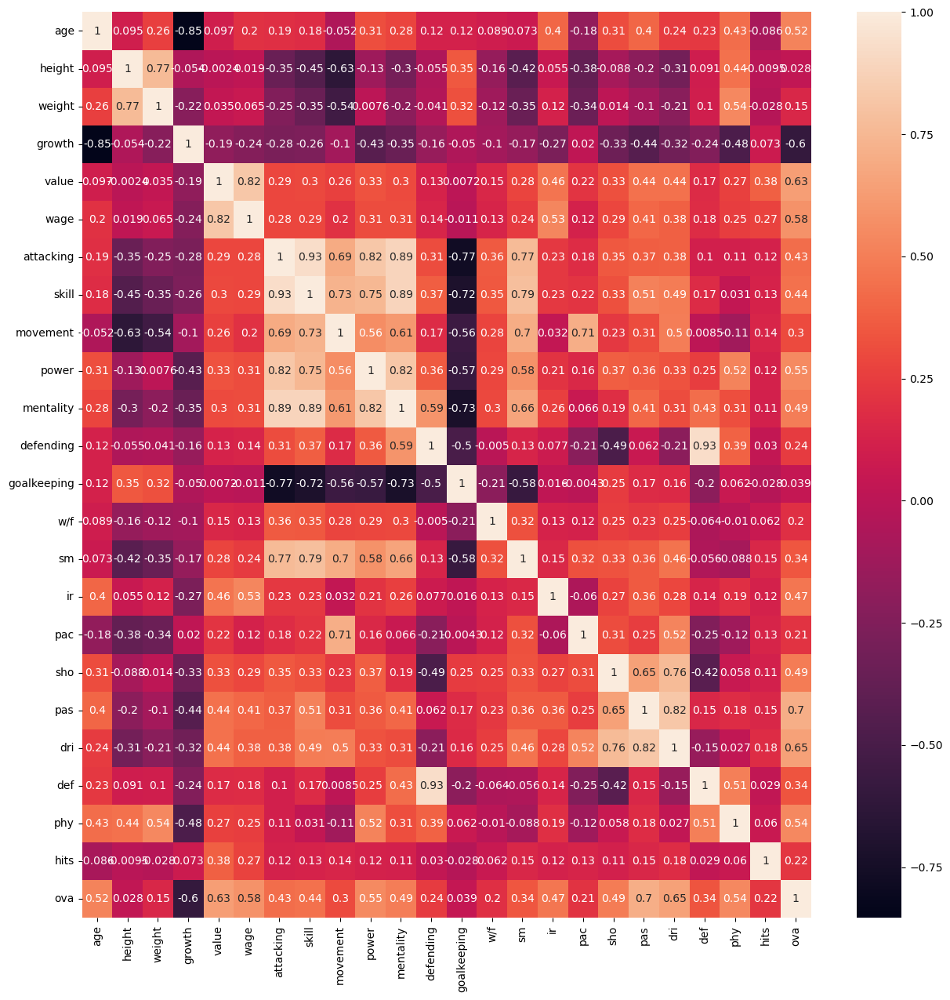

In [10]:
correlations_matrix = fifa_numerical_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(correlations_matrix, annot=True)
plt.show()

In [11]:
correlations_matrix

,age,height,weight,growth,value,wage,attacking,skill,movement,power,...,sm,ir,pac,sho,pas,dri,def,phy,hits,ova
age,1.000000,0.095369,0.257338,-0.854136,0.096757,0.199411,0.191137,0.175981,-0.051802,0.314169,...,0.072587,0.402010,-0.176232,0.311175,0.402361,0.242675,0.225285,0.434448,-0.086071,0.519799
height,0.095369,1.000000,0.768096,-0.053797,-0.002372,0.019131,-0.350153,-0.454377,-0.634614,-0.129197,...,-0.423024,0.054875,-0.380658,-0.087724,-0.204511,-0.310837,0.090802,0.444814,-0.009463,0.028210
weight,0.257338,0.768096,1.000000,-0.219624,0.035361,0.064773,-0.250868,-0.352398,-0.536489,0.007573,...,-0.348603,0.119917,-0.341935,0.013883,-0.100392,-0.210029,0.101667,0.538053,-0.027792,0.149397
growth,-0.854136,-0.053797,-0.219624,1.000000,-0.186735,-0.236945,-0.281668,-0.262893,-0.101370,-0.427800,...,-0.165475,-0.269322,0.019677,-0.334891,-0.439781,-0.320569,-0.240244,-0.484123,0.073142,-0.596642
value,0.096757,-0.002372,0.035361,-0.186735,1.000000,0.820164,0.286165,0.297288,0.262040,0.326979,...,0.276583,0.457919,0.215480,0.325187,0.444784,0.442928,0.168934,0.265114,0.379126,0.632303
wage,0.199411,0.019131,0.064773,-0.236945,0.820164,1.000000,0.284405,0.287640,0.201045,0.307877,...,0.243803,0.530257,0.118841,0.289614,0.411032,0.379007,0.179833,0.250510,0.273144,0.579995
attacking,0.191137,-0.350153,-0.250868,-0.281668,0.286165,0.284405,1.000000,0.928584,0.692493,0.823527,...,0.765994,0.232224,0.181119,0.349931,0.370180,0.379978,0.103203,0.107896,0.118695,0.433092
skill,0.175981,-0.454377,-0.352398,-0.262893,0.297288,0.287640,0.928584,1.000000,0.725776,0.753061,...,0.789008,0.225664,0.217046,0.325009,0.514101,0.486271,0.171817,0.031079,0.126711,0.442666
movement,-0.051802,-0.634614,-0.536489,-0.101370,0.262040,0.201045,0.692493,0.725776,1.000000,0.560489,...,0.700280,0.032241,0.705488,0.227513,0.307423,0.497619,0.008547,-0.111590,0.142825,0.304496
power,0.314169,-0.129197,0.007573,-0.427800,0.326979,0.307877,0.823527,0.753061,0.560489,1.000000,...,0.583623,0.208833,0.157692,0.374796,0.355994,0.332691,0.248330,0.519953,0.116732,0.547839


In [12]:
#dropping height, weight, hits as it has low correlation value with ova.
#dropping age because age and growth have a -0.85
#Height and Weight doesn't seem to have any correlation.
#Dropping pas and dri as base_stats has >0.8 correlation 
#Dropping wage as wage and value have >0.8
#Drop attacking and mentality as they have high correlation with skill, power
#Dropping def as def and defending have high priority

In [13]:
y=fifa_numerical_data.loc[:,['ova']]
y

,ova
0,64
1,77
2,80
3,59
4,65
5,71
6,76
7,60
8,65
9,67


In [14]:
#X_num = fifa_numerical_data.loc[:,["growth","value",'pac','sho','pas','dri','def','phy',"total_stats","w/f","sm","ir","hits"]]
X_num = fifa_numerical_data.loc[:,["growth","value",'pac','sho','pas','dri','phy','skill','movement','power'
                                   ,'defending','goalkeeping',"w/f","sm","ir","hits"]]
# X_num = fifa_numerical_data.loc[:,["growth","value",'pac','sho','pas','dri','phy','skill','movement','power'
#                                    ,'defending','goalkeeping',"hits"]]
X_num

,growth,value,pac,sho,pas,dri,phy,skill,movement,power,defending,goalkeeping,w/f,sm,ir,hits
0,1,525000.0,69,51,63,63,60,286,346,306,148,48,4,2,1,3.0
1,0,8500000.0,83,75,68,82,71,375,404,372,77,55,3,4,2,44.0
2,0,9000000.0,80,77,78,86,56,424,424,308,80,21,4,4,2,73.0
3,13,275000.0,57,44,54,57,60,259,282,277,168,42,2,2,1,7.0
4,8,725000.0,66,44,60,64,66,280,324,280,185,52,2,3,1,4.0
5,0,1400000.0,74,63,70,71,64,333,358,321,103,65,4,3,1,6.0
6,0,6000000.0,67,58,67,73,68,316,361,329,235,39,5,3,2,49.0
7,7,300000.0,62,48,63,60,52,273,323,240,129,51,2,2,1,4.0
8,0,210000.0,34,50,58,55,76,281,200,343,192,49,2,2,1,4.0
9,0,220000.0,54,62,63,64,70,270,299,346,205,54,3,3,1,3.0


In [15]:
# Normalizing data: make data range from 0 - 1, instead of from min to max
transformer = MinMaxScaler().fit(X_num)
x_normalized = transformer.transform(X_num)
print(x_normalized.shape)
x_normalized
fifa_nor_pd = pd.DataFrame(x_normalized, columns=X_num.columns)

(11701, 16)


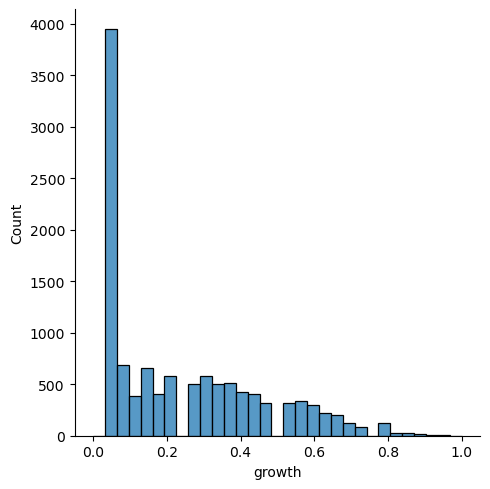

In [16]:
sns.displot(fifa_nor_pd['growth'])
plt.show()

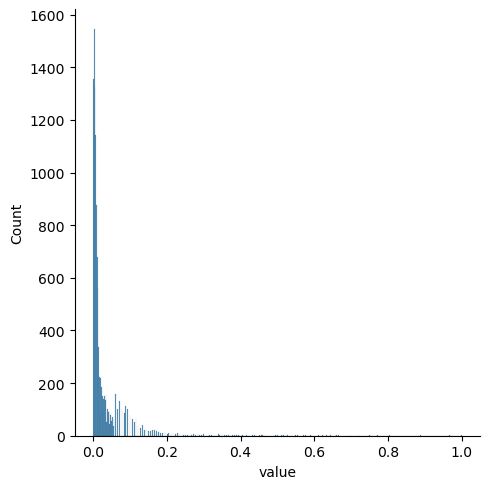

In [17]:
sns.displot(fifa_nor_pd['value'])
plt.show()

In [18]:
# sns.displot(fifa_nor_pd['base_stats'])
# plt.show()

In [19]:
# sns.displot(fifa_nor_pd['total_stats'])
# plt.show()

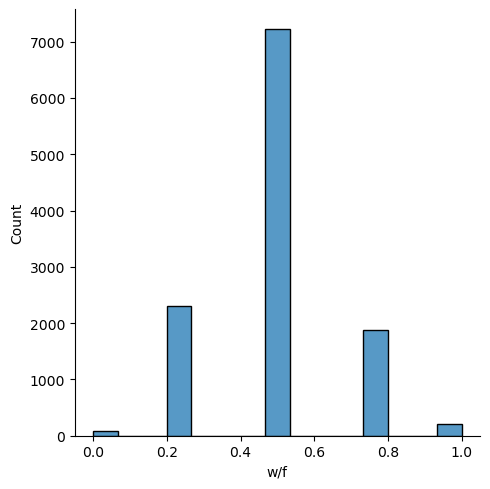

In [20]:
sns.displot(fifa_nor_pd['w/f'])
plt.show()

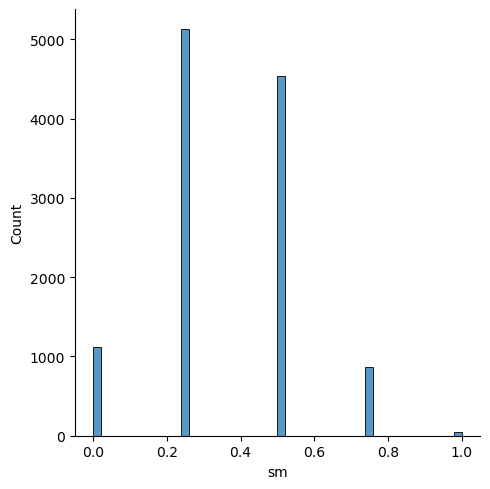

In [21]:
sns.displot(fifa_nor_pd['sm'])
plt.show()

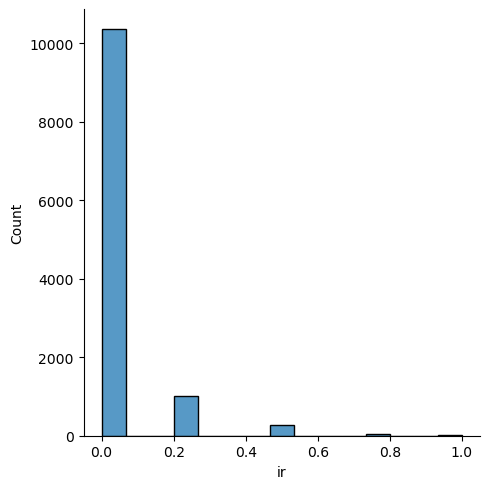

In [22]:
sns.displot(fifa_nor_pd['ir'])
plt.show()

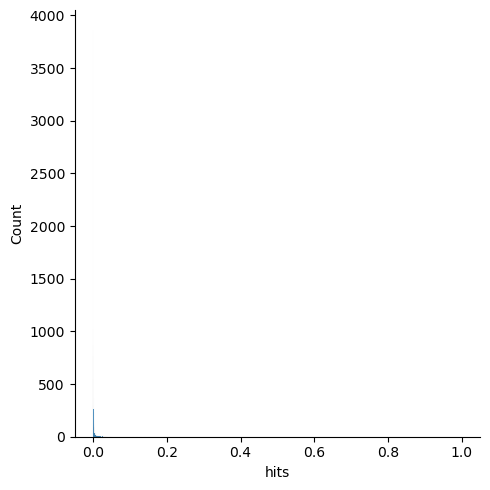

In [23]:
sns.displot(fifa_nor_pd['hits'])
plt.show()

In [24]:
# sns.displot(fifa_nor_pd['weight'])
# plt.show()

In [25]:
# sns.displot(fifa_nor_pd['def'])
# plt.show()

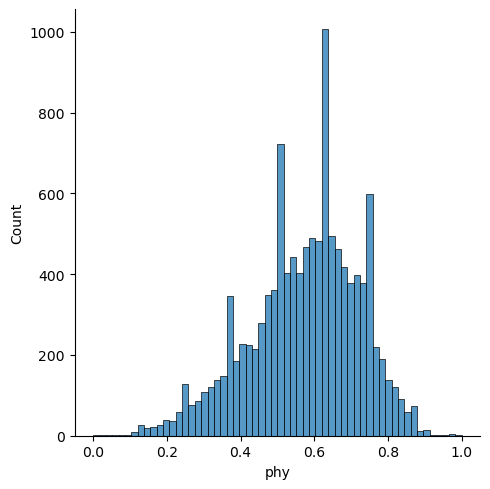

In [26]:
sns.displot(fifa_nor_pd['phy'])
plt.show()

In [27]:
fifa_cat_data.head()

,name,bp,a/w,d/w
0,A. Pasche,CM,High,Medium
1,Alan Carvalho,ST,High,Low
2,S. Giovinco,CAM,High,Medium
3,J. Evans,CDM,Medium,Medium
4,Y. Demoncy,CDM,Low,Medium


In [28]:
X_cat = fifa_cat_data.drop(['name'], axis=1) 

In [29]:
#one hot encoding is a way to turn categorical variables into multiple numerical columns
#OneHotEncoder can take multiple categorical columns, It will just drop the first value (usually highest)
from sklearn.preprocessing import OneHotEncoder
#encoder = OneHotEncoder().fit(X_cat)
encoder = OneHotEncoder(drop='first').fit(X_cat)
#print(encoder.categories_)
encoded = encoder.transform(X_cat).toarray()

#As there are multiple categorical columns, the get_feature_names_out will assign the column name. 
#Otherwise it will be 1s and 0s and confusing
onehot_encoded = pd.DataFrame(encoded, columns = encoder.get_feature_names_out()) 
onehot_encoded.head()
onehot_encoded.shape

(11701, 18)

In [30]:
#label encoding keeps just one column and makes it numerical, but watch out: you may be introducing unintended semantics
#if you want to control which number gets assigned to which category, you can use OrdinalEncoder
#label Encoder takes only 1 1-d array as an argument

from sklearn.preprocessing import LabelEncoder
trial = X_cat.copy()

trial = trial.apply(LabelEncoder().fit_transform)
print(trial)

label_encoded = pd.DataFrame(trial, columns=X_cat.columns)
display(label_encoded.head(20))

       bp  a/w  d/w
0       4    0    2
1      14    0    1
2       0    0    2
3       2    2    2
4       2    1    2
5       7    0    1
6      10    2    0
7       7    2    2
8       1    2    2
9       1    2    2
10      1    2    2
11     11    0    1
12      2    2    2
13     10    2    2
14      1    2    2
15      0    0    1
16      5    2    2
17      4    2    2
18     14    2    1
19      2    2    2
20      5    2    2
21      5    2    2
22     14    0    1
23      0    2    2
24     14    0    2
25      0    0    2
26      1    2    2
27      0    0    2
28     14    2    2
29      7    2    2
30     14    2    2
31     11    2    2
32      1    2    2
33      1    1    0
34      7    2    1
35     14    2    2
36      1    2    2
37     14    2    2
38      1    2    0
39      6    2    2
40     14    0    1
41      2    2    0
42      6    2    2
43      6    0    2
44      4    2    2
45     14    2    2
46      1    1    2
47     11    0    2
48     14    2    2


,bp,a/w,d/w
0,4,0,2
1,14,0,1
2,0,0,2
3,2,2,2
4,2,1,2
5,7,0,1
6,10,2,0
7,7,2,2
8,1,2,2
9,1,2,2


In [31]:
X = pd.concat([fifa_nor_pd, onehot_encoded], axis=1)

In [32]:
X.head()

,growth,value,pac,sho,pas,dri,phy,skill,movement,power,...,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST,a/w_Low,a/w_Medium,d/w_Low,d/w_Medium
0,0.074074,0.005833,0.614286,0.447368,0.558824,0.522388,0.500000,0.569087,0.663818,0.556270,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.037037,0.094444,0.814286,0.763158,0.632353,0.805970,0.666667,0.777518,0.829060,0.768489,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.037037,0.100000,0.771429,0.789474,0.779412,0.865672,0.439394,0.892272,0.886040,0.562701,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.518519,0.003056,0.442857,0.355263,0.426471,0.432836,0.500000,0.505855,0.481481,0.463023,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,0.333333,0.008056,0.571429,0.355263,0.514706,0.537313,0.590909,0.555035,0.601140,0.472669,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [33]:
y.head()

,ova
0,64
1,77
2,80
3,59
4,65


In [34]:
# train test split is the way ML generates its claim to fame: 
# we build the model on a portion of the data but we then validate it in 
# another "fresh" portion
# our model has no opportunity to "cheat": it must accurately guess the values 
# in the "fresh" dataset that it never saw before
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [35]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(9360, 34)
(2341, 34)
(9360, 1)
(2341, 1)


In [36]:
X_train.head()

,growth,value,pac,sho,pas,dri,phy,skill,movement,power,...,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST,a/w_Low,a/w_Medium,d/w_Low,d/w_Medium
1775,0.333333,0.005000,0.542857,0.565789,0.352941,0.447761,0.409091,0.489461,0.566952,0.520900,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
2455,0.037037,0.066667,0.057143,0.815789,0.617647,0.582090,0.651515,0.749415,0.270655,0.649518,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
93,0.037037,0.005556,0.357143,0.223684,0.470588,0.373134,0.712121,0.498829,0.487179,0.562701,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
8952,0.592593,0.001889,0.571429,0.381579,0.455882,0.432836,0.393939,0.522248,0.584046,0.389068,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
7810,0.037037,0.133333,0.814286,0.828947,0.705882,0.761194,0.772727,0.786885,0.851852,0.864952,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [37]:
y_train.head()

,ova
1775,62
2455,74
93,69
8952,55
7810,79


In [38]:
#we train/fit our model like yesterday
lm = linear_model.LinearRegression()
lm.fit(X_train,y_train)

LinearRegression()

In [39]:
from sklearn.metrics import r2_score
predictions = lm.predict(X_train)
r2_score(y_train, predictions)

0.8678365143458505

In [40]:
# But now we evaluate it in the TEST portion of the data, that we did not use for training.
# This way we know our model is genuinely guessing our donations, not just repeating the values it has seen in the training data


predictions_test = lm.predict(X_test)
r2_score(y_test, predictions_test)

0.8642087488225774

In [41]:
y_test[:5]

,ova
2405,49
8025,70
10025,62
10933,72
1402,64


In [42]:
predictions_test[:5]

array([[52.53343428],
       [69.22156962],
       [64.49322635],
       [71.64872918],
       [64.2318437 ]])

In [43]:
from sklearn.metrics import mean_squared_error
mse=mean_squared_error(y_test,predictions_test)
mse

6.429790539828063

In [44]:
rmse = np.sqrt(mean_squared_error(y_test,predictions_test))
rmse

2.535703164770684

In [45]:
y_test.mean()

ova    66.576249
dtype: float64

In [46]:
from sklearn.metrics import mean_absolute_error, r2_score
mae = mean_absolute_error(y_test, predictions_test)
print(mae)

r2 = r2_score(y_test, predictions_test)
r2

1.8833214795796316


0.8642087488225774

In [47]:
# # train test split is the way ML generates its claim to fame: 
# # we build the model on a portion of the data but we then validate it in 
# # another "fresh" portion
# # our model has no opportunity to "cheat": it must accurately guess the values 
# # in the "fresh" dataset that it never saw before
# from sklearn.model_selection import train_test_split
# X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.1, random_state=42)
# print(X_train1.shape)
# print(X_test1.shape)
# print(y_train1.shape)
# print(y_test1.shape)
# X_train1.head()
# y_train1.head()

# #we train/fit our model like yesterday
# lm = linear_model.LinearRegression()
# lm.fit(X_train1,y_train1)
# from sklearn.metrics import r2_score
# predictions1 = lm.predict(X_train1)
# print(r2_score(y_train1, predictions1))

# # But now we evaluate it in the TEST portion of the data, that we did not use for training.
# # This way we know our model is genuinely guessing our donations, not just repeating the values it has seen in the training data


# predictions_test1 = lm.predict(X_test1)
# print(r2_score(y_test1, predictions_test1))

# print(y_test1[:5])
# print(predictions_test1[:5])

# Validating Data

In [48]:
fifa_validate = pd.read_csv('fifa21_validate.csv')

In [49]:
fifa_validate = cleaning.clean_df(fifa_validate)
fifa_validate.head()

,id,name,age,nationality,club,bp,position,team_contract,height,weight,...,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,ova
0,219461,E. Palmer-Brown,23,United States,FK Austria Wien,CB,CB,"FK Austria Wien Jun 30, 2021 On Loan",187.96,194,...,61,61,59,61,67,67,67,61,16,67
1,221896,D. Avdijaj,22,Kosovo,Heart of Midlothian,CAM,LM CAM,Heart of Midlothian 2020 ~ 2020,172.72,154,...,47,47,49,45,38,38,38,45,17,68
2,247428,D. Ochoa,19,United States,Real Salt Lake,GK,GK,Real Salt Lake 2018 ~ 2020,187.96,176,...,18,18,16,16,18,18,18,16,53,54
3,255120,N. Kenneh,16,England,Leeds United,CDM,CB CDM RB,Leeds United 2020 ~ 2022,190.50,170,...,54,54,53,53,54,54,54,53,11,55
4,215556,E. Fernandes,24,Switzerland,1. FSV Mainz 05,CDM,CM CDM,1. FSV Mainz 05 2019 ~ 2023,187.96,170,...,72,72,70,69,68,68,68,69,18,70


In [50]:
fifa_validate.shape

(1999, 101)

In [51]:
print(fifa_validate['ova'].isna().sum())

0


In [52]:
column_subset = ['id','name','age','bp','height','weight','growth','value','wage','attacking','skill','movement',
                'power','mentality','defending','goalkeeping','w/f','sm','a/w','d/w','ir','pac','sho','pas','dri',
                              'def','phy','hits','ova']
               
fifa_validate_subset = fifa_validate[column_subset]
fifa_validate_subset.head()
print(fifa_validate_subset.dtypes)

id               int64
name            object
age              int64
bp              object
height         float64
weight           int64
growth           int64
value          float64
wage           float64
attacking        int64
skill            int64
movement         int64
power            int64
mentality        int64
defending        int64
goalkeeping      int64
w/f              int64
sm               int64
a/w             object
d/w             object
ir               int64
pac              int64
sho              int64
pas              int64
dri              int64
def              int64
phy              int64
hits           float64
ova              int64
dtype: object


In [53]:
fifa_validate_numerical_data = fifa_validate_subset.select_dtypes(include = np.number)
fifa_validate_cat_data = fifa_validate_subset.select_dtypes(include = object)

fifa_validate_numerical_data = fifa_validate_numerical_data.drop(['id'], axis=1)
fifa_validate_numerical_data.head()

,age,height,weight,growth,value,wage,attacking,skill,movement,power,...,sm,ir,pac,sho,pas,dri,def,phy,hits,ova
0,23,187.96,194,7,975000.0,5000.0,230,228,303,288,...,2,1,64,30,50,50,66,74,34.0,67
1,22,172.72,154,5,1200000.0,3000.0,298,330,375,323,...,3,1,74,67,62,74,24,57,12.0,68
2,19,187.96,176,17,120000.0,500.0,48,52,165,171,...,1,1,56,52,53,55,26,53,3.0,54
3,16,190.50,170,23,160000.0,500.0,215,224,275,242,...,2,1,58,34,47,52,53,59,6.0,55
4,24,187.96,170,5,2300000.0,13000.0,295,327,320,337,...,2,1,67,62,68,70,69,71,45.0,70


In [54]:
y2=fifa_validate_numerical_data.loc[:,['ova']]
y2

,ova
0,67
1,68
2,54
3,55
4,70
5,61
6,58
7,55
8,55
9,64


In [55]:
#X_num = fifa_numerical_data.loc[:,["growth","value",'pac','sho','pas','dri','def','phy',"total_stats","w/f","sm","ir","hits"]]
X_num2 = fifa_validate_numerical_data.loc[:,["growth","value",'pac','sho','pas','dri','phy','skill','movement','power'
                                   ,'defending','goalkeeping',"w/f","sm","ir","hits"]]
X_num2

,growth,value,pac,sho,pas,dri,phy,skill,movement,power,defending,goalkeeping,w/f,sm,ir,hits
0,7,975000.0,64,30,50,50,74,228,303,288,200,56,2,2,1,34.0
1,5,1200000.0,74,67,62,74,57,330,375,323,61,53,4,3,1,12.0
2,17,120000.0,56,52,53,55,53,52,165,171,27,269,2,1,1,3.0
3,23,160000.0,58,34,47,52,59,224,275,242,159,36,3,2,1,6.0
4,5,2300000.0,67,62,68,70,71,327,320,337,211,60,4,2,1,45.0
5,5,325000.0,84,55,52,62,71,265,368,328,149,48,3,2,1,3.0
6,22,250000.0,69,26,42,54,57,184,323,230,165,44,2,2,1,35.0
7,9,100000.0,58,56,56,57,54,63,138,179,28,281,2,1,1,3.0
8,10,130000.0,75,54,43,57,46,205,362,269,59,57,3,2,1,4.0
9,4,575000.0,66,60,64,64,61,314,322,302,156,57,2,3,1,3.0


In [56]:
# Normalizing data: make data range from 0 - 1, instead of from min to max
#transformer = MinMaxScaler().fit(X_num2)
x_normalized2 = transformer.transform(X_num2)
print(x_normalized2.shape)
x_normalized2
fifa2_nor_pd = pd.DataFrame(x_normalized2, columns=X_num2.columns)

(1999, 16)


In [57]:
X_cat2 = fifa_validate_cat_data.drop(['name'], axis=1) 

In [58]:
X_cat2.shape

(1999, 3)

In [59]:
#encoder = OneHotEncoder(drop='first').fit(X_cat)
#print(encoder.categories_)
encoded = encoder.transform(X_cat2).toarray()

#As there are multiple categorical columns, the get_feature_names_out will assign the column name. 
#Otherwise it will be 1s and 0s and confusing
onehot_encoded2 = pd.DataFrame(encoded, columns = encoder.get_feature_names_out()) 
onehot_encoded2.head()
onehot_encoded2.shape

(1999, 18)

In [60]:
# trial2 = X_cat2.copy()

# trial2 = trial2.apply(encoder.transform)
# print(trial2)

# label_encoded2 = pd.DataFrame(trial2, columns=X_cat2.columns)
# display(label_encoded2.head(20))

In [61]:
X2 = pd.concat([fifa2_nor_pd, onehot_encoded2], axis=1)

In [62]:
X2.head()

,growth,value,pac,sho,pas,dri,phy,skill,movement,power,...,bp_LWB,bp_RB,bp_RM,bp_RW,bp_RWB,bp_ST,a/w_Low,a/w_Medium,d/w_Low,d/w_Medium
0,0.296296,0.010833,0.542857,0.171053,0.367647,0.328358,0.712121,0.433255,0.541311,0.498392,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.222222,0.013333,0.685714,0.657895,0.544118,0.686567,0.454545,0.672131,0.746439,0.610932,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.666667,0.001333,0.428571,0.460526,0.411765,0.402985,0.393939,0.021077,0.148148,0.122186,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
3,0.888889,0.001778,0.457143,0.223684,0.323529,0.358209,0.484848,0.423888,0.461538,0.350482,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,0.222222,0.025556,0.585714,0.592105,0.632353,0.626866,0.666667,0.665105,0.589744,0.655949,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [63]:
predictions = lm.predict(X2)
r2_score(y2, predictions)

0.86118784765601

In [64]:
mse2=mean_squared_error(y2,predictions)
mse2

6.352249677704152

In [65]:
rmse2 = np.sqrt(mean_squared_error(y2,predictions))
rmse2

2.5203669728244242

In [66]:
y2.mean()

ova    67.086043
dtype: float64